In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
from tqdm import tqdm_notebook as tqdm
import pickle
from pathlib import Path
from nuscenes import NuScenes
from scipy.spatial.transform import Rotation as R 
from math import cos, sin, pi
from lyft_dataset_sdk.lyftdataset import *
from lyft_dataset_sdk.utils.data_classes import LidarPointCloud, Box, Quaternion
from lyft_dataset_sdk.utils.geometry_utils import view_points, transform_matrix
from alfred.fusion.common import compute_3d_box_lidar_coords
from lyft_dataset_sdk.eval.detection.mAP_evaluation import Box3D, recall_precision

In [3]:
from second.utils import simplevis
from second.core.box_np_ops import *

In [4]:
import torch
from google.protobuf import text_format
from second.pytorch.train import build_network
from second.protos import pipeline_pb2
from second.utils import config_tool

## Read Config file

In [6]:
# config_path = "configs/nuscenes/all.fhd.config"
config_path = "/home/ags/second_test/all_fhd.30/pipeline.config"
ckpt_path = "/home/ags/second_test/all_fhd.30/voxelnet-29369.tckpt"

config = pipeline_pb2.TrainEvalPipelineConfig()
with open(config_path, "r") as f:
    proto_str = f.read()
    text_format.Merge(proto_str, config)
input_cfg = config.eval_input_reader
model_cfg = config.model.second
config_tool.change_detection_range_v2(model_cfg, [-50, -50, 50, 50])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")

## Build Network, Target Assigner and Voxel Generator

In [7]:
net = build_network(model_cfg).to(device).eval()
net.load_state_dict(torch.load(ckpt_path))
target_assigner = net.target_assigner
voxel_generator = net.voxel_generator
classes = target_assigner.classes

## Generate Anchors

In [7]:
grid_size = voxel_generator.grid_size
feature_map_size = grid_size[:2] // config_tool.get_downsample_factor(model_cfg)
feature_map_size = [*feature_map_size, 1][::-1]

anchors = target_assigner.generate_anchors(feature_map_size)["anchors"]
anchors = torch.tensor(anchors, dtype=torch.float32, device=device)
anchors = anchors.view(1, -1, 7)

In [30]:
def get_predictions(token, info):
    v_path = info["lidar_path"]
    points = np.fromfile(
        v_path, dtype=np.float32, count=-1).reshape([-1, 5])[:, :4]
    res = voxel_generator.generate(points, max_voxels=90000)
    voxels, coords, num_points = res['voxels'], res['coordinates'], res['num_points_per_voxel']
    #print(voxels.shape)
    # add batch idx to coords
    coords = np.pad(coords, ((0, 0), (1, 0)), mode='constant', constant_values=0)
    voxels = torch.tensor(voxels, dtype=torch.float32, device=device)
    coords = torch.tensor(coords, dtype=torch.int32, device=device)
    num_points = torch.tensor(num_points, dtype=torch.int32, device=device)
    example = {
        "anchors": anchors,
        "voxels": voxels,
        "num_points": num_points,
        "coordinates": coords,
    }
    pred = net(example)[0]
    pred['box3d_lidar'] = pred["box3d_lidar"].detach().cpu().numpy()
    pred['scores'] = pred['scores'].detach().cpu().numpy()
    pred['label_preds'] = pred['label_preds'].detach().cpu().numpy()
    return pred

In [31]:
def get_pred_boxes(pred, threshold, token):
    boxes_lidar = pred["box3d_lidar"]
    boxes_class = pred["label_preds"]
    scores = pred['scores']
    boxes_lidar = boxes_lidar[scores>threshold]
    boxes_class = boxes_class[scores>threshold]
    boxes_scores = scores[scores>threshold]
    preds_classes = [classes[x] for x in boxes_class]
    boxes = []
    for idx in range(len(boxes_lidar)):
        center = boxes_lidar[idx, :3]
        yaw = - boxes_lidar[idx, 6] - pi/2
        size = boxes_lidar[idx, 3:6]
        name = preds_classes[idx]
        detection_score = boxes_scores[idx]
        label = boxes_class[idx]
        quat = Quaternion(scalar=np.cos(yaw / 2), vector=[0, 0, np.sin(yaw / 2)])
        #quat = Quaternion(axis=[0, 0, 1], radians=yaw)
        box = Box(
            center=center,
            size=size,
            orientation=quat,
            score=detection_score,
            name=name,
            label=label,
            token=token
        )
        boxes.append(box)
    return boxes


In [11]:
phase = 'train'
data = 'v1.0-trainval' if phase=='train' else 'v1.0-test'
lyft = LyftDataset(data_path=f'../../../data/lyft/{phase}/', json_path=f'../../../data/lyft/{phase}/{data}/', verbose=0) 
# nusc = NuScenes(dataroot=f'../../data/lyft/{phase}/', version=data, verbose=0) 

In [4]:
info_path = '/home/ags/second_test/all_fhd.29/results/step_41055/result.pkl'
with open(info_path, 'rb') as f:
    info = pickle.load(f)#['infos']

In [8]:
len(info), info[0].keys()

(4158, dict_keys(['box3d_lidar', 'scores', 'label_preds', 'metadata']))

In [14]:
def to_glb(box, info):
    # lidar -> ego -> global
    # info should belong to exact same element in `gt` dict
    box.rotate(Quaternion(info['lidar2ego_rotation']))
    box.translate(np.array(info['lidar2ego_translation']))
    box.rotate(Quaternion(info['ego2global_rotation']))
    box.translate(np.array(info['ego2global_translation']))
    return box

In [13]:
info[0]['gt_boxes']

array([[-11.99265476,   1.8422694 ,  -1.10069048,   1.999     ,
          4.817     ,   1.636     ,   1.47833827],
       [-87.23412552, -11.60417834,  -2.73868536,   1.695     ,
          4.333     ,   1.484     ,  -1.57761369],
       [ 22.18104489,  -5.5254102 ,  -0.76480527,   1.851     ,
          4.709     ,   1.757     ,  -1.6324851 ],
       [ 16.11144296,   1.12634236,  -0.4422849 ,   2.271     ,
          6.289     ,   1.873     ,   1.49928222],
       [-89.55880842,  -5.92402097,  -2.4767395 ,   1.77      ,
          4.159     ,   1.579     ,   1.4993948 ],
       [-61.04356452,   4.18054587,  -1.69538728,   0.736     ,
          0.744     ,   1.829     ,  -1.62117798],
       [ 75.35697145,  -2.34521068,  -0.1423204 ,   1.616     ,
          4.428     ,   1.336     ,  -1.62515272],
       [ 39.33542311,   4.78838097,  -0.15714634,   2.025     ,
          4.609     ,   1.728     ,   1.49381934]])

In [20]:
gt_data = [] 
for inf in tqdm(info):
    sample_token = inf['token']
    sample = lyft.get('sample', sample_token)
    for ann_token in sample['anns']:
        ann_record = lyft.get('sample_annotation', ann_token)
        data = {
            'sample_token': sample_token,
            'translation': ann_record['translation'],
            'size': ann_record['size'],
            'rotation': ann_record['rotation'],
            'name': ann_record['category_name']
        }
        gt_data.append(data)

100%|██████████| 4032/4032 [00:00<00:00, 18226.85it/s]


In [25]:
len(gt_data), gt_data[0]

(111528,
 {'sample_token': 'f7fca7320eaf90ffc6d20bf5477a18ca61c042979eaaf0cda36603e1a969dad9',
  'translation': [1002.3932119976462, 2517.525612249236, -21.410812547321655],
  'size': [1.999, 4.817, 1.636],
  'rotation': [-0.9905516179554115, 0, 0, 0.13714041040450659],
  'name': 'car'})

In [30]:
gt_data_path = '../../../data/lyft/train/gt_data.json'
with open(gt_data_path, 'w') as f:
    json.dump(gt_data, f, indent=2)

In [11]:
# info_path = input_cfg.dataset.kitti_info_path
# root_path = Path(input_cfg.dataset.kitti_root_path)
# info_path = '../../data/lyft/test/infos_test.pkl'
# root_path = '../../data/lyft/test/'

classes = ['car', 'bicycle', 'animal', 'bus', 'emergency_vehicle', 'other_vehicle', 'motorcycle', 'pedestrian', 'truck']
res_path = '/home/ags/second_test/all_fhd/results/step_29325/result.pkl'
info_path = '../../../data/lyft/train/infos_val.pkl'
with open(res_path, 'rb') as f:
    results = pickle.load(f)#['infos']
    
with open(info_path, 'rb') as f:
    gt = pickle.load(f)['infos']
#df = pd.read_csv('../../data/lyft/sample_submission.csv')
df = pd.read_csv('../../data/lyft/train.csv')

# info_val.pkl and result.pkl are a list of dictionaries, which are out of order, sorting them acc to token
gt = sorted(gt, key=lambda x: x['token'])
results = sorted(results, key=lambda x: x['metadata']['token'])
# sanity check
for i in range(len(gt)):
    assert gt[i]['token'] == results[i]['metadata']['token']
    results[i]['box3d_lidar'] = results[i]['box3d_lidar'].detach().cpu().numpy()
    results[i]['scores'] = results[i]['scores'].detach().cpu().numpy()
    results[i]['label_preds'] = results[i]['label_preds'].detach().cpu().numpy()

In [30]:
gt[0].keys(), results[0].keys()

(dict_keys(['lidar_path', 'cam_front_path', 'token', 'sweeps', 'lidar2ego_translation', 'lidar2ego_rotation', 'ego2global_translation', 'ego2global_rotation', 'timestamp', 'gt_boxes', 'gt_names', 'gt_velocity', 'num_lidar_pts', 'num_radar_pts']),
 dict_keys(['box3d_lidar', 'scores', 'label_preds', 'metadata']))

In [46]:
threshold = 0.5
for idx, token in enumerate(tqdm(df.Id.values)):
    pred = get_predictions(token, gt[idx])
#     pred = results[idx]
    pred_boxes = get_pred_boxes(pred, threshold, token)
    #df.loc[idx, 'PredictionString'] = pred_str 
    print(len(pred_boxes))
    break
    
#df.to_csv('first_sub.csv', index=False)

  0%|          | 0/22680 [00:00<?, ?it/s]

88


In [51]:
from nuscenes.eval.detection.config import eval_detection_configs
cls_range_map = eval_detection_configs['cvpr_2019']["class_range"]
cls_range_map

{'car': 50,
 'pedestrian': 40,
 'animal': 40,
 'other_vehicle': 30,
 'bus': 50,
 'motorcycle': 40,
 'truck': 50,
 'emergency_vehicle': 50,
 'bicycle': 40}

In [1]:
def _lidar_nusc_box_to_global(info, boxes, classes, eval_version="cvpr_2019"):
    import pyquaternion
    box_list = []
    for box in boxes:
        # Move box to ego vehicle coord system
        box.rotate(pyquaternion.Quaternion(info['lidar2ego_rotation']))
        box.translate(np.array(info['lidar2ego_translation']))
        # filter det in ego.
        cls_range_map = eval_detection_configs[eval_version]["class_range"]
        radius = np.linalg.norm(box.center[:2], 2)
        det_range = cls_range_map[classes[box.label]]
        if radius > det_range:
            continue
        # Move box to global coord system
        box.rotate(pyquaternion.Quaternion(info['ego2global_rotation']))
        box.translate(np.array(info['ego2global_translation']))
        box_list.append(box)
    return box_list

In [48]:
info = gt[0]
new_boxes = _lidar_nusc_box_to_global(info, pred_boxes, classes)

In [49]:
len(new_boxes)

82

In [122]:
# idx = 0
# threshold = 0.4
# pred = results[idx]
# pred_boxes = get_pred_boxes(pred, threshold)
# len(pred_boxes)

4

In [110]:
sample = lyft.get('sample', info['token'])
lidar_token = sample['data']['LIDAR_TOP']

In [52]:
pred.keys(), gt[0].keys()

(dict_keys(['box3d_lidar', 'scores', 'label_preds', 'metadata']),
 dict_keys(['lidar_path', 'cam_front_path', 'token', 'sweeps', 'lidar2ego_translation', 'lidar2ego_rotation', 'ego2global_translation', 'ego2global_rotation', 'timestamp', 'gt_boxes', 'gt_names', 'gt_velocity', 'num_lidar_pts', 'num_radar_pts']))

In [54]:
# using results.pkl
idx = 0
threshold = 0.3
# pred = results[idx]
info = gt[idx]
pred_boxes_lidar = pred["box3d_lidar"]
scores = pred['scores']
pred_boxes_lidar = pred_boxes_lidar[scores>threshold]
vis_voxel_size = [0.1, 0.1, 0.1]
vis_point_range = [-50, -30, -3, 50, 30, 1]
v_path = info["lidar_path"]
points = np.fromfile(
    v_path, dtype=np.float32, count=-1).reshape([-1, 5])[:, :4]
bev_map = simplevis.point_to_vis_bev(points, vis_voxel_size, vis_point_range)
# bev_map = simplevis.draw_box_in_bev(org_bev_map.copy(), vis_point_range, pred_boxes_lidar, [0, 255, 0], 2)
# plt.imshow(org_bev_map); plt.show()
coors_range = vis_point_range
coors_range = np.array(coors_range)
bev_corners = center_to_corner_box2d(
    pred_boxes_lidar[:, [0, 1]], pred_boxes_lidar[:, [3, 4]], pred_boxes_lidar[:, 6])
# [x, y], [w, l], [theta]
# bev_corners: N, 4, 2
bev_corners -= coors_range[:2]
bev_corners *= np.array(
    bev_map.shape[:2])[::-1] / (coors_range[3:5] - coors_range[:2])
#[1000, 600] / [100, 60] => multiply by 10 to all coords.

bev_lines = np.concatenate(
    [bev_corners[:, [0, 1, 2, 3]], bev_corners[:, [1, 2, 3, 0]]], axis=2)
# bev_lines.shape = N, 3, 4
bev_lines = bev_lines.reshape(-1, 4)
colors = np.tile(np.array([0, 255, 0]).reshape(1, 3), [bev_lines.shape[0], 1])
colors = colors.astype(np.int32)
img = simplevis.cv2_draw_lines(bev_map, bev_lines, colors, 2)
plt.plot(0, 0, "x", color="red")
plt.imshow(img)
# horizontally flipped plots w.r.t lyft.render_functions
# notice, the image is centered around lidar's coord origin 

TypeError: list indices must be integers or slices, not str

In [84]:
info.keys(), pred.keys()

(dict_keys(['lidar_path', 'cam_front_path', 'token', 'sweeps', 'lidar2ego_translation', 'lidar2ego_rotation', 'ego2global_translation', 'ego2global_rotation', 'timestamp', 'gt_boxes', 'gt_names', 'gt_velocity', 'num_lidar_pts', 'num_radar_pts']),
 dict_keys(['box3d_lidar', 'scores', 'label_preds', 'metadata']))

In [183]:
info['lidar2ego_translation']

[1.1965191000051791, 6.114102133017362e-05, 1.8181514265550847]

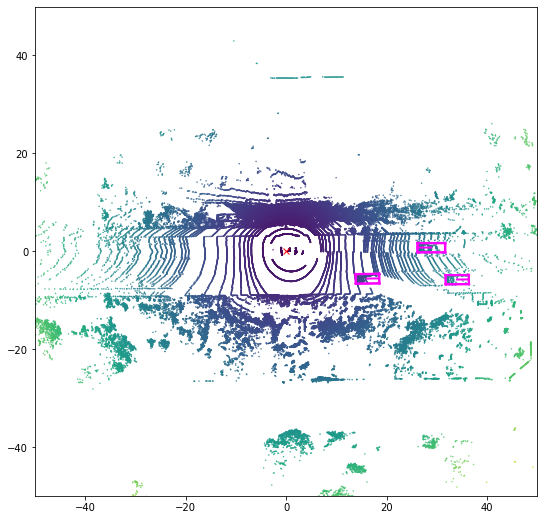

In [53]:
# plotting predicted and ground truth boxes on corresponding lidar point cloud
# pred boxes in lidar's FoR, we get the ground truth boxes in lidar's FoR too.
idx = 0
threshold = 0.5
info = gt[idx]
pred = results[idx]
pred_boxes = get_pred_boxes(pred, threshold)
v_path = info["lidar_path"]
#gt_boxes = info['gt_boxes']
lidar_token = lyft.get('sample', info['token'])['data']['LIDAR_TOP']
points = np.fromfile(v_path, dtype=np.float32, count=-1).reshape([-1, 5])[:, :4]
axes_limit = 50
_, ax = plt.subplots(1, 1, figsize=(9, 9))
dists = np.sqrt(np.sum(points[:, :2] ** 2, axis=1))
colors = np.minimum(1, dists / axes_limit / np.sqrt(2))
ax.scatter(points[:, 0], points[:, 1], c=colors, s=0.2)
ax.plot(0, 0, "x", color="red")
# Limit visible range.
ax.set_xlim(-axes_limit, axes_limit)
ax.set_ylim(-axes_limit, axes_limit)
for pbox in pred_boxes:
#     print(pbox)
    c = np.array(lyft.explorer.get_color('cone')) / 255.0 # black
    pbox.render(ax, view=np.eye(4), colors=(c, c, c))
_, gt_boxes, _ = lyft.get_sample_data(lidar_token, flat_vehicle_coordinates=False) # notice flat_vehicle_coordinates=False 
for box in gt_boxes:
#     print(box)
    c = np.array(lyft.explorer.get_color('animal')) / 255.0 # animal
    box.render(ax, view=np.eye(4), colors=(c, c, c))

In [184]:
info.keys()

dict_keys(['lidar_path', 'cam_front_path', 'token', 'sweeps', 'lidar2ego_translation', 'lidar2ego_rotation', 'ego2global_translation', 'ego2global_rotation', 'timestamp', 'gt_boxes', 'gt_names', 'gt_velocity', 'num_lidar_pts', 'num_radar_pts'])

In [186]:
def to_glb(box, info):
    # lidar -> ego -> global
    # info should belong to exact same element in `gt` dict
    box.rotate(Quaternion(info['lidar2ego_rotation']))
    box.translate(np.array(info['lidar2ego_translation']))
    box.rotate(Quaternion(info['ego2global_rotation']))
    box.translate(np.array(info['ego2global_translation']))
    return box

In [187]:
# let's transform boxes from lidar's FoR to global FoR
glb_pboxes = [to_glb(box, info) for box in pred_boxes]
glb_gboxes = [to_glb(box, info) for box in gt_boxes]

In [221]:
str(box.orientation.yaw_pitch_roll)

'(1.2694441766937974, -1.2343329538595696e-17, -1.6762352262995766e-17)'

In [207]:
def toBox3D(box, info):
    return Box3D(
                sample_token=info['token'],
                translation=box.center,
                size=box.wlh,
                rotation=box.orientation.elements,
                name=box.name
            )

In [208]:
pboxes = [toBox3D(box, info).serialize() for box in glb_pboxes]
gboxes = [toBox3D(box, info).serialize() for box in glb_gboxes]

In [209]:
from lyft_dataset_sdk.eval.detection import mAP_evaluation
iou_threshold = 0.5
# average_precisions = mAP_evaluation.get_average_precisions(gboxes, pboxes, classes, iou_threshold)
gt_by_class_name = mAP_evaluation.group_by_key(gboxes, "name")
pred_by_class_name = mAP_evaluation.group_by_key(pboxes, "name")

In [210]:
for key in gt_by_class_name.keys():
    print(key, len(gt_by_class_name[key]))
for key in pred_by_class_name.keys():
    print(key, len(pred_by_class_name[key]))

car 5
pedestrian 1
car 3
animal 1


In [211]:
recall_precision([gt_by_class_name['car'][0]], [pred_by_class_name['car'][0]], 0.01)
gt_by_class_name['car'][0], pred_by_class_name['car'][0]

({'sample_token': '00121c2823c110cba385b624f224fd9c409dd14e48d22fdceed226f59e29d165',
  'translation': array([ 2910.57499592, -1320.97051816,    96.64517928]),
  'size': array([2.086, 4.532, 1.829]),
  'rotation': array([8.06443089e-01, 3.46944695e-18, 3.46944695e-18, 5.91311715e-01]),
  'name': 'car',
  'volume': 17.290912408,
  'score': -1},
 {'sample_token': '00121c2823c110cba385b624f224fd9c409dd14e48d22fdceed226f59e29d165',
  'translation': array([ 2893.85096994, -1377.86929872,    95.66361126]),
  'size': array([1.8543835, 4.664889 , 1.6254115], dtype=float32),
  'rotation': array([ 0.81102831, -0.00184018, -0.03030196,  0.5842187 ]),
  'name': 'car',
  'volume': 14.060611,
  'score': -1})

In [212]:
average_precisions = np.zeros(len(classes))

for class_id, class_name in enumerate(classes):
    if class_name in pred_by_class_name and class_name in gt_by_class_name:
        recalls, precisions, average_precision = recall_precision(
            gt_by_class_name[class_name], pred_by_class_name[class_name], iou_threshold
        )
        average_precisions[class_id] = average_precision
        

In [213]:
average_precisions#.mean()

array([0.6, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ])

In [17]:
# sample = lyft.get('sample', info['token'])
# lyft.render_sample_data(sample['data']['CAM_BACK'])

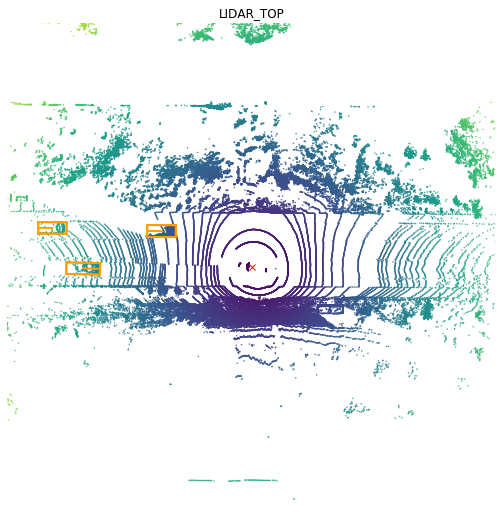

In [90]:
lyft.render_sample_data(lidar_token)

In [62]:
for p in boxes_lidar:
    xyz = np.array([p[: 3]])
    hwl = np.array([p[3: 6]])
    r_y = [p[6]]
    pts3d = compute_3d_box_lidar_coords(xyz, hwl, angles=r_y, origin=(0.5, 0.5, 0.5), axis=2)[0]
    points = [[0,0,0],[1,0,0],[0,1,0],[1,1,0],
        [0,0,1],[1,0,1],[0,1,1],[1,1,1]]
#     print(pts3d, points)
    lines = [[0,1],[1,2],[2,3],[3,0],
        [4,5],[5,6],[6,7],[7,4],
        [0,4],[1,5],[2,6],[3,7]]
    break

In [ ]:
draw_3d_plot(lidar_token, boxes)

In [21]:

sample_id = info['token']
sample = lyft.get('sample', sample_id)
sample_data = lyft.get(
    'sample_data', 
    sample['data']['LIDAR_TOP']
)
pc = LidarPointCloud.from_file(
    Path(os.path.join(str(lyft.data_path),
                      sample_data['filename']))
)
_, gt_boxes, _ = lyft.get_sample_data(
    sample['data']['LIDAR_TOP'], flat_vehicle_coordinates=False
)


df_tmp = pd.DataFrame(pc.points[:3, :].T, columns=['x', 'y', 'z'])
df_tmp['norm'] = np.sqrt(np.power(df_tmp[['x', 'y', 'z']].values, 2).sum(axis=1))
scatter = go.Scatter3d(
    x=df_tmp['x'],
    y=df_tmp['y'],
    z=df_tmp['z'],
    mode='markers',
    marker=dict(
        size=1,
        color=df_tmp['norm'],
        opacity=0.8
    )
)
def get_lines(boxes):
    x_lines = []
    y_lines = []
    z_lines = []

    def f_lines_add_nones():
        x_lines.append(None)
        y_lines.append(None)
        z_lines.append(None)

    ixs_box_0 = [0, 1, 2, 3, 0]
    ixs_box_1 = [4, 5, 6, 7, 4]

    for box in boxes:
        points = view_points(box.corners(), view=np.eye(3), normalize=False)
        x_lines.extend(points[0, ixs_box_0])
        y_lines.extend(points[1, ixs_box_0])
        z_lines.extend(points[2, ixs_box_0])    
        f_lines_add_nones()
        x_lines.extend(points[0, ixs_box_1])
        y_lines.extend(points[1, ixs_box_1])
        z_lines.extend(points[2, ixs_box_1])
        f_lines_add_nones()
        for i in range(4):
            x_lines.extend(points[0, [ixs_box_0[i], ixs_box_1[i]]])
            y_lines.extend(points[1, [ixs_box_0[i], ixs_box_1[i]]])
            z_lines.extend(points[2, [ixs_box_0[i], ixs_box_1[i]]])
            f_lines_add_nones()

    lines = go.Scatter3d(
        x=x_lines,
        y=y_lines,
        z=z_lines,
        mode='lines',
        name='lines'
    )

    return lines
gt_lines = get_lines(gt_boxes)
pred_lines = get_lines(boxes)
fig = go.Figure(data=[scatter, gt_lines, pred_lines])
fig.update_layout(scene_aspectmode='data')
fig.show()

In [ ]:
def plot_box_2d(box, axis, view, colors, normalize=False, linewidth=1.0):
    '''Plot boxes in the 3d figure'''
    corners = view_points(box.corners(), view, normalize=normalize)#
    def draw_rect(selected_corners, color):
        prev = selected_corners[-1]
        for corner in selected_corners:
            axis.plot([prev[0], corner[0]], [prev[1], corner[1]], [prev[2], corner[2]], color=color, linewidth=linewidth)
            prev = corner

    # Draw the sides
    for i in range(4):
        axis.plot(
            [corners.T[i][0], corners.T[i + 4][0]],
            [corners.T[i][1], corners.T[i + 4][1]],
            [corners.T[i][2], corners.T[i + 4][2]],
            color=colors[2],
            linewidth=linewidth,
        )

    # Draw front (first 4 corners) and rear (last 4 corners) rectangles(3d)/lines(2d)
    draw_rect(corners.T[:4], colors[0]) #4x3
    draw_rect(corners.T[4:], colors[1])

In [ ]:
def plot_box(box, axis, view, colors, normalize=False, linewidth=1.0):
    '''Plot boxes in the 3d figure'''
    corners = view_points(box.corners(), view, normalize=normalize)#
    def draw_rect(selected_corners, color):
        prev = selected_corners[-1]
        for corner in selected_corners:
            axis.plot([prev[0], corner[0]], [prev[1], corner[1]], [prev[2], corner[2]], color=color, linewidth=linewidth)
            prev = corner

    # Draw the sides
    for i in range(4):
        axis.plot(
            [corners.T[i][0], corners.T[i + 4][0]],
            [corners.T[i][1], corners.T[i + 4][1]],
            [corners.T[i][2], corners.T[i + 4][2]],
            color=colors[2],
            linewidth=linewidth,
        )

    # Draw front (first 4 corners) and rear (last 4 corners) rectangles(3d)/lines(2d)
    draw_rect(corners.T[:4], colors[0]) #4x3
    draw_rect(corners.T[4:], colors[1])

In [ ]:
def draw_3d_plot(lidar_token, boxes):
    '''Plot the lidar + annotations on a 3D figure'''
    # sample lidar point cloud
    lidar_points = get_lidar_points(lidar_token)
    points = 0.5 # fraction of lidar_points to plot, to reduce the clutter
    points_step = int(1. / points)
    pc_range = range(0, lidar_points.shape[1], points_step)
    lidar_points = lidar_points[:, pc_range]
    
    # Get boxes, instead of current sensor's coordinate frame, use vehicle frame which is aligned to z-plane in world
    #_, boxes, _ = lyft.get_sample_data(
    #    lidar_token, flat_vehicle_coordinates=True
    #)
    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111, projection='3d')                    
    point_size = 0.01 * (1. / points) # size of the dots on plot
    ax.set_facecolor('black')
    ax.grid(False)
    ax.scatter(*lidar_points, s=point_size, c='white', cmap='gray')
    for box in boxes:
        c = np.array(lyft.explorer.get_color(box.name)) / 255.0
        plot_box(box, ax, view=np.eye(3), colors=(c, c, c), linewidth=1)
    ax.set_xlim3d(-40, 40)
    ax.set_ylim3d(-40, 40)
    ax.set_zlim3d(-4, 40)
    
    # make the panes transparent
    ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.set_title(lidar_token, color='white')
#     filename = 'tmp/frame_{0:0>4}.png'.format(idx)
#     plt.savefig(filename)
#     plt.close(fig)
    plt.show()
#     return filename

In [ ]:
def get_lidar_points(lidar_token):
    '''Get lidar point cloud in the frame of the ego vehicle'''
    sd_record = lyft.get("sample_data", lidar_token)
    sensor_modality = sd_record["sensor_modality"]
    
    # Get aggregated point cloud in lidar frame.
    sample_rec = lyft.get("sample", sd_record["sample_token"])
    chan = sd_record["channel"]
    ref_chan = "LIDAR_TOP"
    pc, times = LidarPointCloud.from_file_multisweep(
        lyft, sample_rec, chan, ref_chan, num_sweeps=1
    )
    # Compute transformation matrices for lidar point cloud
    cs_record = lyft.get("calibrated_sensor", sd_record["calibrated_sensor_token"])
    pose_record = lyft.get("ego_pose", sd_record["ego_pose_token"])
    vehicle_from_sensor = np.eye(4)
    vehicle_from_sensor[:3, :3] = Quaternion(cs_record["rotation"]).rotation_matrix
    vehicle_from_sensor[:3, 3] = cs_record["translation"]
    
    ego_yaw = Quaternion(pose_record["rotation"]).yaw_pitch_roll[0]
    rot_vehicle_flat_from_vehicle = np.dot(
        Quaternion(scalar=np.cos(ego_yaw / 2), vector=[0, 0, np.sin(ego_yaw / 2)]).rotation_matrix,
        Quaternion(pose_record["rotation"]).inverse.rotation_matrix,
    )
    vehicle_flat_from_vehicle = np.eye(4)
    vehicle_flat_from_vehicle[:3, :3] = rot_vehicle_flat_from_vehicle
    points = view_points(
        pc.points[:3, :], np.dot(vehicle_flat_from_vehicle, vehicle_from_sensor), normalize=False
    )
    return points

In [ ]:
pc = get_lidar_points(sample['data']['LIDAR_TOP'])

In [ ]:
pred.keys()

In [ ]:
vis_voxel_size = [0.1, 0.1, 0.1]
vis_point_range = [-50, -30, -3, 50, 30, 1]
org_bev_map = simplevis.point_to_vis_bev(points, vis_voxel_size, vis_point_range)
bev_map = simplevis.draw_box_in_bev(org_bev_map.copy(), vis_point_range, boxes_lidar, [0, 255, 0], 2)

In [ ]:
box3d_lidar = pred['box3d_lidar']
scores = pred['scores']
label_preds = pred['label_preds']
metadata = pred['metadata']

In [ ]:
box3d_lidar.shape

In [ ]:
label_preds

In [ ]:
classes = target_assigner.classes

In [ ]:

classes = target_assigner.classes
preds = [classes[x] for x in label_preds]
preds

In [ ]:
sub = pd.DataFrame(list(sub.items()))
sub.columns = sample_sub.columns
sub.head()

In [ ]:
img_id = train.iloc[0]['Id']
ps = train.iloc[0]['PredictionString']
ps = ps.split()
objects = [ps[x:x+8] for x in range(0, len(ps), 8)]
len(objects), objects[0]

In [ ]:
train.iloc[0]['PredictionString']

In [61]:
with open('/home/ags/second_test/all_fhd/results/step_29325/result.pkl', 'rb') as f:
    results = pickle.load(f)
with open('../../data/lyft/train/infos_val.pkl', 'rb') as f:
    infos_val = pickle.load(f)['infos']

In [63]:
len(results), results[0].keys()

(4158, dict_keys(['box3d_lidar', 'scores', 'label_preds', 'metadata']))

In [64]:
len(infos_val), infos_val[0].keys()

(4158,
 dict_keys(['lidar_path', 'cam_front_path', 'token', 'sweeps', 'lidar2ego_translation', 'lidar2ego_rotation', 'ego2global_translation', 'ego2global_rotation', 'timestamp', 'gt_boxes', 'gt_names', 'gt_velocity', 'num_lidar_pts', 'num_radar_pts']))

In [76]:
infos[0].keys()

dict_keys(['lidar_path', 'cam_front_path', 'token', 'sweeps', 'lidar2ego_translation', 'lidar2ego_rotation', 'ego2global_translation', 'ego2global_rotation', 'timestamp', 'gt_boxes', 'gt_names', 'gt_velocity', 'num_lidar_pts', 'num_radar_pts'])

In [81]:
infos[0]['gt_boxes'].shape

(60, 7)

In [47]:
yaw = 1.5
r = R.from_dcm([
    [cos(yaw), -sin(yaw), 0],
    [sin(yaw),  cos(yaw), 0],
    [   0,     0, 1],
])  # a rotation matrix for rotation along z axis. 
quat = r.as_quat()
# XYZW -> WXYZ order of elements
quat = quat[[3,0,1,2]]
quat1 = Quaternion(scalar=np.cos(yaw / 2), vector=[0, 0, np.sin(yaw / 2)])
quat, quat1

(array([0.73168887, 0.        , 0.        , 0.68163876]),
 Quaternion(0.7316888688738209, 0.0, 0.0, 0.6816387600233341))

In [ ]:
def get_global_from_lidar(sample_token):
    sample_record = lyft.get("sample", sample_token) # get sample record
    lidar_record = lyft.get("sample_data", sample_record["data"]["LIDAR_TOP"])
    cs_record = lyft.get('calibrated_sensor', lidar_record['calibrated_sensor_token']) 
    ego_pose_record = lyft.get("ego_pose", lidar_record["ego_pose_token"])
    car_from_lidar = transform_matrix(cs_record['translation'], Quaternion(cs_record['rotation']), inverse=False)
    global_from_car = transform_matrix(ego_pose_record['translation'], Quaternion(ego_pose_record['rotation']), inverse=False)
    global_from_lidar = np.dot(global_from_car, car_from_lidar)
    return global_from_lidar

def transform_points(points, transf_matrix):
    """
    Transform (N, 3) or (N, 3) points using transformation matrix.
    """
    points = points.T
    points = np.vstack((points[:3, :], np.ones(points.shape[1])))  # 4xN
    new_points = transf_matrix.dot(points) # 4xN
    new_points = new_points[:3, :] # 3xN
    return new_points.T # Nx3

### evaluation metric test